# Applied Data Science (MAST30034) Tutorial 2

`pyspark` (15-45 minutes):
- _Under the hood - lazy evaluation_
- Basic transformation functions
- Spark SQL (Optional)

`geopandas` (30 minutes):
- Installation
- Shapefiles
- Spark User Defined Functions (UDF)

New Visualizations and Basic Analysis (15 minutes):
- `folium`
- Choropleths
- A revision of Pearson Correlation
- Feature Engineering

You may use any visualization taught in previous subjects for your Project (assumed knowledge).
_________________

In [1]:
from pyspark.sql import SparkSession, functions as F

# Create a spark session (which will run spark jobs)
spark = (
    SparkSession.builder.appName("MAST30034 Tutorial 2")
    .config("spark.sql.repl.eagerEval.enabled", True) 
    .config("spark.sql.parquet.cacheMetadata", "true")
    .getOrCreate()
)

Setting default log level to "WARN".
To adjust logging level use sc.setLogLevel(newLevel). For SparkR, use setLogLevel(newLevel).


22/08/01 10:51:07 WARN NativeCodeLoader: Unable to load native-hadoop library for your platform... using builtin-java classes where applicable


In [2]:
sdf = spark.read.parquet('/Users/a123/Documents/GitHub/MAST30034_Python/data/tlc_data/')

## Transformations and Immutability
Transformations in PySpark will transform a Spark DataFrame into a new DataFrame without altering the original data. This means that Spark is **immutable** (i.e there is no `inplace=True` argument like some `pandas` methods).

For example, operations will return transformed results rather than mutating the original. Therefore, it is quite common to see:
```python
sdf = sdf.withColumn(
    'int_col',
    F.col('str_numerical_col').cast('INT')
)
```


## Lazy Evaluation at the High Level
Finally, Spark operations are evaluated lazily. This is because there is a driver under-the-hood which looks to optimize and make your operations more efficient. This means that your data does not "move" until called upon. Let's explore how this works at the high-level.

### DAG (Directed Acyclic Graph)
For those who have not taken 2nd year algorithms, a DAG is a graph where there are "no loops". That is, one can only traverse forward and never backwards. This is especially useful (in this context) with representing a job or processes. For example:

![dag](https://external-content.duckduckgo.com/iu/?u=http%3A%2F%2Fmichal.karzynski.pl%2Fimages%2Fillustrations%2F2017-03-19%2Fairflow-example-dag.png&f=1&nofb=1)

Here, we have a DAG generated by Apache Airflow which manages a certain job. From left to right, things are run in order.

### Spark, DAGs, and Lazy Evaluation 
Specifically for Spark, transformations are added to a DAG similar to the above example. Whenever the Spark driver requests data (i.e writing, using `.collect()`, etc), the DAG gets executed. This means that until we need to **physicalize** the data, no code is run at all.

Why is this good? The major advantage is that Spark makes several code optimizations under-the-hood by looking at the whole DAG each time you add a step. For any in-built transformation or function, Spark will optimize the efficiency by reordering the steps or taking shortcuts to simplify several steps. This is not possible if the data is physicalized each time you run it like `pandas`. 


Example:
- You execute every transformation like `pandas`.
- This means you must physicalise every intermediate step into memory. Whilst this can be fast, you are limited by the memory (RAM). 
- When you take into account the costs of RAM over time (especially if this is an ETL pipeline that you run daily), this is not efficient. This is because you are never really interested in the intermediate transformation steps when running a production pipeline. 
- As such, your job when writing Spark is to tell Spark the overall process and let it figure it out.

General Rules:
- Always use built-in functions and methods where possible. This is because Spark is designed to optimize code that it understands.
- When applying a custom user function known as a **User Defined Function** (UDF), Spark does not understand the function code. This means it is is black box and will eat up resources and time.
- Never use `.collect()` if possible, aim to plan your code out and only physicalize your data when required. 
- Save "checkpoints" for your dataset. If you have applied a few transformations and are happy with this intermediate step, save it. That way, you don't need to keep rerunning your code every time you need the data.

### Lazy Evaluation in applications
Lazy evaluation is also extensively used in many other applications. Python natively have generator/yield as a way to implement lazy evaluation. TensorFlow, a popular tensor computing library also implements lazy evaluation via [computation graphs](https://d3lm.medium.com/understand-tensorflow-by-mimicking-its-api-from-scratch-faa55787170d) (DAG).

<img src="../../media/tensorflow_lazyeval.png" alt-text="computation graph" width=800px>

In [3]:
## Lazy evaluation samples
# Native python lazy evaluation (yield, generator)
import time

def create_object(n=4):
    obj = []
    for i in range(n):
        obj.append(time.sleep(i))
    return obj

def create_object_lazy(n=4):
    for i in range(n):
        yield time.sleep(i)

def execute_action(obj, n=3):
    obj = iter(obj)
    for i in range(n):
        next(obj)
        # Do some action
        pass

# This object takes 6 seconds to create
%time eager = create_object()
# Executed immediately, total time: 6 sec
%time execute_action(eager)

# This object is created immediately
%time lazy = create_object_lazy()
# Takes 3 sec to execute, total time: 3 sec
%time execute_action(lazy)

CPU times: user 1.48 ms, sys: 2.21 ms, total: 3.69 ms
Wall time: 6.01 s
CPU times: user 8 µs, sys: 1 µs, total: 9 µs
Wall time: 11.9 µs
CPU times: user 4 µs, sys: 0 ns, total: 4 µs
Wall time: 8.11 µs
CPU times: user 1.42 ms, sys: 448 µs, total: 1.87 ms
Wall time: 3 s


## Renaming Fields and Data Type Conversions

In [4]:
sdf.show(1, vertical=True, truncate=100)

-RECORD 0------------------------------------
 VendorID              | 1                   
 tpep_pickup_datetime  | 2022-02-01 11:06:58 
 tpep_dropoff_datetime | 2022-02-01 11:19:24 
 passenger_count       | 1.0                 
 trip_distance         | 5.4                 
 RatecodeID            | 1.0                 
 store_and_fwd_flag    | N                   
 PULocationID          | 138                 
 DOLocationID          | 252                 
 payment_type          | 1                   
 fare_amount           | 17.0                
 extra                 | 1.75                
 mta_tax               | 0.5                 
 tip_amount            | 3.9                 
 tolls_amount          | 0.0                 
 improvement_surcharge | 0.3                 
 total_amount          | 23.45               
 congestion_surcharge  | 0.0                 
 airport_fee           | 1.25                
only showing top 1 row



In [5]:
sdf.printSchema()

root
 |-- VendorID: long (nullable = true)
 |-- tpep_pickup_datetime: timestamp (nullable = true)
 |-- tpep_dropoff_datetime: timestamp (nullable = true)
 |-- passenger_count: double (nullable = true)
 |-- trip_distance: double (nullable = true)
 |-- RatecodeID: double (nullable = true)
 |-- store_and_fwd_flag: string (nullable = true)
 |-- PULocationID: long (nullable = true)
 |-- DOLocationID: long (nullable = true)
 |-- payment_type: long (nullable = true)
 |-- fare_amount: double (nullable = true)
 |-- extra: double (nullable = true)
 |-- mta_tax: double (nullable = true)
 |-- tip_amount: double (nullable = true)
 |-- tolls_amount: double (nullable = true)
 |-- improvement_surcharge: double (nullable = true)
 |-- total_amount: double (nullable = true)
 |-- congestion_surcharge: double (nullable = true)
 |-- airport_fee: double (nullable = true)



Functions:
```python
sdf.withColumnRenamed(
    'column_from',
    'column_to'
)

# example 1 for converting data types
sdf.withColumn(
    'column_to',
    F.col('column_from').cast('data type')
)

# example 2 for applying UDFs
sdf.withColumn(
    'column_to',
    some_udf(F.col('column_from'))
)
```

In [6]:
# example of renaming a column (we won't save it)
sdf.withColumnRenamed(
    'VendorID',
    'vendor_id'
).printSchema()

root
 |-- vendor_id: long (nullable = true)
 |-- tpep_pickup_datetime: timestamp (nullable = true)
 |-- tpep_dropoff_datetime: timestamp (nullable = true)
 |-- passenger_count: double (nullable = true)
 |-- trip_distance: double (nullable = true)
 |-- RatecodeID: double (nullable = true)
 |-- store_and_fwd_flag: string (nullable = true)
 |-- PULocationID: long (nullable = true)
 |-- DOLocationID: long (nullable = true)
 |-- payment_type: long (nullable = true)
 |-- fare_amount: double (nullable = true)
 |-- extra: double (nullable = true)
 |-- mta_tax: double (nullable = true)
 |-- tip_amount: double (nullable = true)
 |-- tolls_amount: double (nullable = true)
 |-- improvement_surcharge: double (nullable = true)
 |-- total_amount: double (nullable = true)
 |-- congestion_surcharge: double (nullable = true)
 |-- airport_fee: double (nullable = true)



In [7]:
# converting a couple columns to integers and saving it
for field in ('PU', 'DO'):
    field = f'{field}LocationID'
    sdf = sdf.withColumn(
        field,
        F.col(field).cast('INT')
    )
    
sdf.printSchema()

root
 |-- VendorID: long (nullable = true)
 |-- tpep_pickup_datetime: timestamp (nullable = true)
 |-- tpep_dropoff_datetime: timestamp (nullable = true)
 |-- passenger_count: double (nullable = true)
 |-- trip_distance: double (nullable = true)
 |-- RatecodeID: double (nullable = true)
 |-- store_and_fwd_flag: string (nullable = true)
 |-- PULocationID: integer (nullable = true)
 |-- DOLocationID: integer (nullable = true)
 |-- payment_type: long (nullable = true)
 |-- fare_amount: double (nullable = true)
 |-- extra: double (nullable = true)
 |-- mta_tax: double (nullable = true)
 |-- tip_amount: double (nullable = true)
 |-- tolls_amount: double (nullable = true)
 |-- improvement_surcharge: double (nullable = true)
 |-- total_amount: double (nullable = true)
 |-- congestion_surcharge: double (nullable = true)
 |-- airport_fee: double (nullable = true)



See here for the list of accepted data types: https://spark.apache.org/docs/latest/sql-ref-datatypes.html

Let's try some more advanced conversions. For example, if we look at the `store_and_fwd_flag`, it actually represents a boolean condition. According to the Data Dictionary though, we currently have `N` and `Y` representing `No` and `Yes` respectively.

In pandas, we would have done something like this:
```python
df['store_and_fwd_flag'] = (df['store_and_fwd_flag'] == 'Y').astype(bool)
```


In [8]:
sdf = sdf.withColumn(
    'store_and_fwd_flag',
    (F.col("store_and_fwd_flag") == 'Y').cast('BOOLEAN')
)

sdf.show(1, vertical=True, truncate=100)

-RECORD 0------------------------------------
 VendorID              | 1                   
 tpep_pickup_datetime  | 2022-02-01 11:06:58 
 tpep_dropoff_datetime | 2022-02-01 11:19:24 
 passenger_count       | 1.0                 
 trip_distance         | 5.4                 
 RatecodeID            | 1.0                 
 store_and_fwd_flag    | false               
 PULocationID          | 138                 
 DOLocationID          | 252                 
 payment_type          | 1                   
 fare_amount           | 17.0                
 extra                 | 1.75                
 mta_tax               | 0.5                 
 tip_amount            | 3.9                 
 tolls_amount          | 0.0                 
 improvement_surcharge | 0.3                 
 total_amount          | 23.45               
 congestion_surcharge  | 0.0                 
 airport_fee           | 1.25                
only showing top 1 row



Lastly, you can also do built-in `if`/`else` based results with `F.when()` and `.otherwise()`. Let's say we want a boolean field to determine if the record is valid.

In [9]:
sdf = sdf.withColumn(
    'is_valid_record',
    # when we have non-zero distance/passenger/total amount then True
    # else False
    F.when(
        (F.col('trip_distance') > 0)
        & (F.col('passenger_count') > 0)
        & (F.col('total_amount') > 0),
        True
    ).otherwise(False)
)

In [10]:
sdf.show(1, vertical=True, truncate=100)

-RECORD 0------------------------------------
 VendorID              | 1                   
 tpep_pickup_datetime  | 2022-02-01 11:06:58 
 tpep_dropoff_datetime | 2022-02-01 11:19:24 
 passenger_count       | 1.0                 
 trip_distance         | 5.4                 
 RatecodeID            | 1.0                 
 store_and_fwd_flag    | false               
 PULocationID          | 138                 
 DOLocationID          | 252                 
 payment_type          | 1                   
 fare_amount           | 17.0                
 extra                 | 1.75                
 mta_tax               | 0.5                 
 tip_amount            | 3.9                 
 tolls_amount          | 0.0                 
 improvement_surcharge | 0.3                 
 total_amount          | 23.45               
 congestion_surcharge  | 0.0                 
 airport_fee           | 1.25                
 is_valid_record       | true                
only showing top 1 row



Make sure to read through the data dictionary carefully to determine which records are valid or invalid. As long as you justify your logic (and it adheres to the data dictionary), then you will get marks.

Be especially careful with `total_amount` as it is pretty much the addition of several other fields making it a useless feature when conducting analysis or using it in a regression model.

## Spark SQL
For those who have taken database systems or prefer using SQL, you can use Spark SQL to run queries.

Whilst there are plenty of options (creating tables, views, temp tables, etc), we'll stick with views. If you are unsure what a view is, think of it as some kind of layer that sits on top of the dataset.

In [11]:
# create a temporary SQL view for the DataFrame
sdf.createOrReplaceTempView('taxi')

sql_query = spark.sql("""
SELECT *
FROM taxi
WHERE passenger_count == 5
    AND trip_distance > 0
""")

sql_query.limit(5)

VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,RatecodeID,store_and_fwd_flag,PULocationID,DOLocationID,payment_type,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount,congestion_surcharge,airport_fee,is_valid_record
2,2022-02-01 11:55:21,2022-02-01 12:03:50,5.0,1.74,1.0,false,79,164,2,8.0,0.5,0.5,0.0,0.0,0.3,11.8,2.5,0.0,true
2,2022-02-01 11:30:59,2022-02-01 11:38:44,5.0,2.7,1.0,false,137,140,1,9.5,0.5,0.5,1.5,0.0,0.3,14.8,2.5,0.0,true
2,2022-02-01 10:51:58,2022-02-01 11:33:23,5.0,5.95,1.0,false,141,163,2,27.5,0.5,0.5,0.0,0.0,0.3,31.3,2.5,0.0,true
2,2022-02-01 10:57:28,2022-02-01 11:01:45,5.0,0.76,1.0,false,238,239,1,5.0,0.5,0.5,1.32,0.0,0.3,10.12,2.5,0.0,true
2,2022-02-01 11:07:36,2022-02-01 11:17:51,5.0,3.58,1.0,false,48,24,1,13.0,0.5,0.5,5.04,0.0,0.3,21.84,2.5,0.0,true


## GeoPandas
- **NOTE: This only applies on the more recent datasets that use zones over coordinates**

Requirements:
- `geopandas`

Shapefile Links:
- https://s3.amazonaws.com/nyc-tlc/misc/taxi_zones.zip
- https://s3.amazonaws.com/nyc-tlc/misc/taxi+_zone_lookup.csv

**Installation (MacOS Intel chip, Linux, WSL/WSL2):**
- MacOS and Linux users use `pip3 install geopandas` or equivalent.

**Installation (MacOS M1/M2 chip):**
```bash
brew install geos
export DYLD_LIBRARY_PATH=/opt/homebrew/opt/geos/lib/
pip3 install shapely
brew install gdal
pip3 install fiona
brew install proj
pip3 install pyproj
pip3 install pygeos
pip3 install geopandas
```
If you run into any errors related to `pyproj` please restart your terminal. It should work after.

Why do I need to do this for MacOS M1/M2 chip? `geopandas` itself is written in Python so there are no issues, but it depends on other libraries that are written in `C/C++` and need to be compiled. The Intel and M1/M2 architecture is difference, hence this roundabout method of installing.

**Installation (Windows 10/11):**
1. Visit https://www.lfd.uci.edu/~gohlke/pythonlibs/
2. You will need 2 different `.whl` (wheel) files. These are `GDAL` and `fiona`.
    - `GDAL`: https://www.lfd.uci.edu/~gohlke/pythonlibs/#gdal
    - `fiona`: https://www.lfd.uci.edu/~gohlke/pythonlibs/#fiona
3. Download the version **corresponding to your device OS and Python**. For example:
    - `Fiona‑1.8.21‑cp311‑cp311‑win_amd64.whl` represents the `fiona v1.8.21` wheel designed for `c-python 3.11` for `windows` running a `64bit` architecture (`amd64`).
4. Once both packages are downloaded, you will need to open up command prompt and `cd` into the directory. 
5. Install the dependencies **in this specific order**. 
    - `GDAL`  (wheel you downloaded)
    - `fiona` (wheel you downloaded)
    - `geopandas` (`pip` package)
    
Example for Windows 11 (64 bit) running `Python 3.9.X`:
```bash
# cd into directory containing files
cd geopandas_dependencies
pip3 install GDAL‑3.4.3‑cp39‑cp39‑win_amd64.whl
pip3 install Fiona‑1.8.21‑cp39‑cp39‑win_amd64.whl
pip3 install geopandas
```

Why do I need to do this for Windows? Like many other useful Data Science and Engineering packages, they are designed to be native to Linux and bash. Windows OS is not suitable hence our recommendation to install WSL/WSL2.

In [3]:
import pandas as pd
import geopandas as gpd

Depending on your OS and Python version, you may recieve a warning with `pygeos`. As long as it works, it is fine.

In [4]:
# sf stands for shape file
sf = gpd.read_file("/Users/a123/Documents/GitHub/MAST30034_Python/data/taxi_zones/taxi_zones.shp")
zones = pd.read_csv("/Users/a123/Documents/GitHub/MAST30034_Python/data/taxi_zones/taxi+_zone_lookup.csv")

sf.head()

,OBJECTID,Shape_Leng,Shape_Area,zone,LocationID,borough,geometry
0,1,0.116357,0.000782,Newark Airport,1,EWR,"POLYGON ((933100.918 192536.086, 933091.011 19..."
1,2,0.433470,0.004866,Jamaica Bay,2,Queens,"MULTIPOLYGON (((1033269.244 172126.008, 103343..."
2,3,0.084341,0.000314,Allerton/Pelham Gardens,3,Bronx,"POLYGON ((1026308.770 256767.698, 1026495.593 ..."
3,4,0.043567,0.000112,Alphabet City,4,Manhattan,"POLYGON ((992073.467 203714.076, 992068.667 20..."
4,5,0.092146,0.000498,Arden Heights,5,Staten Island,"POLYGON ((935843.310 144283.336, 936046.565 14..."


Shapefiles are one way of storing geometric objects. When working with these, you will usually need to convert it into a more human-understandable coordinate system such as latitude/longitude. See https://www.earthdatascience.org/courses/earth-analytics/spatial-data-r/understand-epsg-wkt-and-other-crs-definition-file-types/ for details on conversion.

In [5]:
# Convert the geometry shaape to to latitude and longitude
# Please attribute this if you are using it
sf['geometry'] = sf['geometry'].to_crs("+proj=longlat +ellps=WGS84 +datum=WGS84 +no_defs")
sf.head()

,OBJECTID,Shape_Leng,Shape_Area,zone,LocationID,borough,geometry
0,1,0.116357,0.000782,Newark Airport,1,EWR,"POLYGON ((-74.18445 40.69500, -74.18449 40.695..."
1,2,0.433470,0.004866,Jamaica Bay,2,Queens,"MULTIPOLYGON (((-73.82338 40.63899, -73.82277 ..."
2,3,0.084341,0.000314,Allerton/Pelham Gardens,3,Bronx,"POLYGON ((-73.84793 40.87134, -73.84725 40.870..."
3,4,0.043567,0.000112,Alphabet City,4,Manhattan,"POLYGON ((-73.97177 40.72582, -73.97179 40.725..."
4,5,0.092146,0.000498,Arden Heights,5,Staten Island,"POLYGON ((-74.17422 40.56257, -74.17349 40.562..."


Note how the `geometry` attribute now looks a bit more familiar and understandable.

In [6]:
zones.head()

,LocationID,Borough,Zone,service_zone
0,1,EWR,Newark Airport,EWR
1,2,Queens,Jamaica Bay,Boro Zone
2,3,Bronx,Allerton/Pelham Gardens,Boro Zone
3,4,Manhattan,Alphabet City,Yellow Zone
4,5,Staten Island,Arden Heights,Boro Zone


Which attribute should we join on? What kind of join will we do i.e left, right, inner?

In [7]:
gdf = gpd.GeoDataFrame(
    pd.merge(zones, sf, on='LocationID', how='inner')
)

gdf.head()

,LocationID,Borough,Zone,service_zone,OBJECTID,Shape_Leng,Shape_Area,zone,borough,geometry
0,1,EWR,Newark Airport,EWR,1,0.116357,0.000782,Newark Airport,EWR,"POLYGON ((-74.18445 40.69500, -74.18449 40.695..."
1,2,Queens,Jamaica Bay,Boro Zone,2,0.433470,0.004866,Jamaica Bay,Queens,"MULTIPOLYGON (((-73.82338 40.63899, -73.82277 ..."
2,3,Bronx,Allerton/Pelham Gardens,Boro Zone,3,0.084341,0.000314,Allerton/Pelham Gardens,Bronx,"POLYGON ((-73.84793 40.87134, -73.84725 40.870..."
3,4,Manhattan,Alphabet City,Yellow Zone,4,0.043567,0.000112,Alphabet City,Manhattan,"POLYGON ((-73.97177 40.72582, -73.97179 40.725..."
4,5,Staten Island,Arden Heights,Boro Zone,5,0.092146,0.000498,Arden Heights,Staten Island,"POLYGON ((-74.17422 40.56257, -74.17349 40.562..."


Awesome! We can now combine `geopandas` with `folium` to plot nice zones. Requirements:
- A `folium` map object with a central coordinate of interest
- A `GeoJSON` that can be parsed by `folium`

The `GeoJSON` should be a `JSON` object representing a specific zone (`LocationID`) with its geometry.

In [8]:
# create a JSON 
geoJSON = gdf[['LocationID', 'geometry']].drop_duplicates('LocationID').to_json()

# print the first 300 chars of the json
print(geoJSON[:300])

{"type": "FeatureCollection", "features": [{"id": "0", "type": "Feature", "properties": {"LocationID": 1}, "geometry": {"type": "Polygon", "coordinates": [[[-74.18445299999996, 40.694996000000096], [-74.18448899999999, 40.695095000000066], [-74.18449799999996, 40.69518500000006], [-74.18438099999997


Now, let's add it to the `folium` map object. We'll use what we call a **Choropleth Map** to show zones.

Folium Docs: http://python-visualization.github.io/folium/modules.html?highlight=choropleth#folium.features.Choropleth

In [11]:
import folium

In [12]:
_map = folium.Map(location=[40.66, -73.94], tiles="Stamen Terrain", zoom_start=10)

# refer to the folium documentations on how to plot aggregated data.
_map.add_child(folium.Choropleth(
    geo_data=geoJSON,
    name='choropleth',
))

_map.save('/Users/a123/Documents/GitHub/MAST30034_Python/plots/foliumChoroplethMap.html')
_map

## Personal Checklist for Visualisations and Dashboards:
1. Your visualisation needs to tell a story.
2. It should be interpretable without being overly verbose.
3. The scale and axis need to make sense (and you can assume the reader knows the difference between a normal scale vs log scale).
4. The choice of visualisation needs to make sense:
    - Line plot vs Bar chart with non-numerical categories
    - Map plot with points vs clusters for each location
    - Scatterplot vs Histogram plot to see distribution
    - etc
5. Choice of colour scheme / alpha / size need to be easy on the eyes.

At the end of the day, even if you think your visualisation is "pretty" or "beautiful", if a reader cannot understand it, then it is not a good visualisation.

Let's go through an example on **pickup locations**.

In [13]:
# first off, join the geometries with the dataset
df = pd.read_parquet('/Users/a123/Documents/GitHub/MAST30034_Python/data/tute_data/sample_data.parquet')
df.head()

,VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,RatecodeID,store_and_fwd_flag,PULocationID,DOLocationID,payment_type,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount,congestion_surcharge,airport_fee
0,2,2022-01-01 08:47:55,2022-01-01 08:52:56,4.0,1.10,1.0,N,166,238,1,6.0,0.5,0.5,1.96,0.0,0.3,11.76,2.5,0.0
1,2,2022-01-01 08:40:45,2022-01-01 08:47:22,1.0,1.14,1.0,N,170,229,1,6.5,0.5,0.5,2.06,0.0,0.3,12.36,2.5,0.0
2,2,2022-01-01 08:51:22,2022-01-01 09:06:08,1.0,7.37,1.0,N,141,231,2,22.0,0.5,0.5,0.00,0.0,0.3,25.80,2.5,0.0
3,1,2022-01-01 08:31:53,2022-01-01 08:36:31,0.0,1.30,1.0,N,140,229,1,6.0,3.0,0.5,2.90,0.0,0.3,12.70,2.5,0.0
4,1,2022-01-01 08:41:40,2022-01-01 08:46:11,0.0,1.30,1.0,N,163,236,1,6.0,3.0,0.5,2.45,0.0,0.3,12.25,2.5,0.0


In [14]:
df = df \
    .merge(gdf[['LocationID', 'geometry']], left_on='PULocationID', right_on='LocationID') \
    .drop('LocationID', axis=1)

df.head()

,VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,RatecodeID,store_and_fwd_flag,PULocationID,DOLocationID,payment_type,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount,congestion_surcharge,airport_fee,geometry
0,2,2022-01-01 08:47:55,2022-01-01 08:52:56,4.0,1.10,1.0,N,166,238,1,6.0,0.5,0.5,1.96,0.0,0.3,11.76,2.5,0.0,"POLYGON ((-73.95708 40.81430, -73.95627 40.813..."
1,2,2022-01-01 08:21:28,2022-01-01 08:27:21,1.0,1.31,1.0,N,166,41,2,6.5,0.5,0.5,0.00,0.0,0.3,7.80,0.0,0.0,"POLYGON ((-73.95708 40.81430, -73.95627 40.813..."
2,2,2022-01-01 08:18:01,2022-01-01 08:29:25,2.0,2.39,1.0,N,166,142,1,11.0,0.5,0.5,2.96,0.0,0.3,17.76,2.5,0.0,"POLYGON ((-73.95708 40.81430, -73.95627 40.813..."
3,1,2022-01-01 12:06:46,2022-01-01 12:25:47,1.0,3.90,1.0,N,166,243,2,16.0,0.5,0.5,0.00,0.0,0.3,17.30,0.0,0.0,"POLYGON ((-73.95708 40.81430, -73.95627 40.813..."
4,2,2022-01-01 18:59:44,2022-01-01 18:59:56,3.0,0.00,5.0,N,166,166,2,9.0,0.0,0.0,0.00,0.0,0.3,11.80,2.5,0.0,"POLYGON ((-73.95708 40.81430, -73.95627 40.813..."


To start off, many students may sum each zone (location) and plot the total earnings to gain a rough idea of income. Whilst this can be okay for a first analysis, it may be more useful to look at proportion by dividing by frequency.

Why is this a more suitable idea?


In [15]:
proportions = df[['PULocationID', 'total_amount']] \
                .groupby('PULocationID') \
                .agg(
                    {
                        'total_amount': 'sum', # sum over total amount earned
                        'PULocationID': 'count' # count number of instances from sample
                    }
                ) \
                .rename({'PULocationID': 'total_trips'}, axis=1)

proportions.head()

,total_amount,total_trips
PULocationID,,
1,1888.90,19
2,69.85,1
3,82.00,2
4,2562.81,139
5,256.10,2


In [23]:
proportions['avg_trip_amount'] = proportions['total_amount'] / proportions['total_trips']
proportions.head()

,total_amount,total_trips,avg_trip_amount
PULocationID,,,
1,1571.00,18,87.277778
2,69.85,1,69.850000
3,94.55,2,47.275000
4,2723.68,139,19.594820
5,306.55,3,102.183333


Remember, this is **only a random sample of 5% of the true population**.

In [24]:
m = folium.Map(location=[40.73, -73.74], tiles="Stamen Terrain", zoom_start=10)

# refer to the folium documentations on more information on how to plot aggregated data.
c = folium.Choropleth(
    geo_data=geoJSON, # geoJSON 
    name='choropleth', # name of plot
    data=df, # data source
    columns=['PULocationID','total_amount'], # the columns required
    key_on='properties.LocationID', # this is from the geoJSON's properties
    fill_color='YlOrRd', # color scheme
    nan_fill_color='black',
    legend_name='Average Trip Earnings USD$'
)

c.add_to(m)

m

- What do the black coloured zones represent?
- Which area seems most profitable so far?

Let's add some markers for the airports to differentiate them.

In [25]:
gdf.loc[gdf['Zone'].str.contains('Airport')]

,LocationID,Borough,Zone,service_zone,OBJECTID,Shape_Leng,Shape_Area,zone,borough,geometry
0,1,EWR,Newark Airport,EWR,1,0.116357,0.000782,Newark Airport,EWR,"POLYGON ((-74.18445 40.69500, -74.18449 40.695..."
131,132,Queens,JFK Airport,Airports,132,0.245479,0.002038,JFK Airport,Queens,"MULTIPOLYGON (((-73.82503 40.66358, -73.82486 ..."
137,138,Queens,LaGuardia Airport,Airports,138,0.107467,0.000537,LaGuardia Airport,Queens,"MULTIPOLYGON (((-73.87125 40.78604, -73.86978 ..."


However, the `folium` [Marker object](https://python-visualization.github.io/folium/modules.html?highlight=marker#folium.map.Marker) requires coordinates. 

We can derive zone centroids using `geopandas`'s `.centroid` attribute of a `geometry`. This will return a `Point` object (not what we want just yet) which can be converted into `latitude` (`y`) and `longitude` (`x`) coordinates by accessing the `.x` and `.y` attribute of the `Point`.

In [26]:
# (y, x) since we want (lat, long)
gdf['centroid'] = gdf['geometry'].apply(lambda x: (x.centroid.y, x.centroid.x))
gdf[['Zone', 'LocationID', 'centroid']].head()

,Zone,LocationID,centroid
0,Newark Airport,1,"(40.69183120640148, -74.17400027276294)"
1,Jamaica Bay,2,"(40.616745291659896, -73.83129854302221)"
2,Allerton/Pelham Gardens,3,"(40.864473684775454, -73.84742223236714)"
3,Alphabet City,4,"(40.723752141584804, -73.97696825691766)"
4,Arden Heights,5,"(40.55265928694568, -74.18848410184931)"


In [27]:
for zone_name, coord in gdf.loc[gdf['Zone'].str.contains('Airport'), ['Zone', 'centroid']].values:
    m.add_child(
        folium.Marker(location=coord, popup=zone_name)
    )
m

## Spark User Defined Functions (UDF)
So far, all the functions covered have been about simple aggregations, filtering rows, or changing data types. Sometimes though, you will require more advanced preprocessing techniques that are not built-in with Spark.

The best way to create a UDF is to use the class decorator. Here's the general syntax:
```python
from pyspark.sql import functions as F
from pyspark.sql.types import SomeDataType

# class decorator method for creating a UDF
# You must always specify the expected return type (i.e string, array, int, etc)
@F.udf(SomeDataType)
def some_udf(col):
    ...
    return ...
       
sdf = sdf.withColumn(
    'transformed_col',
    some_udf(F.col('raw_col'))
)
```

Let's grab the centroids using a Spark UDF. We cover it here as this is an example of something that Spark can't do with built-in methods.

First off, we will need to convert `gdf` into a spark dataframe:
1. Convert the `geometry` into `wkt` (Well Known Text). This is essentially a way of encoding geometry objects into text because Spark does not handle custom data types. We'll use `shapely` (a `geopandas` dependency) to do this.
2. Create a Spark dataframe from the `gdf`.
3. Create UDF and apply.

You should now be able to join your Spark dataset with this Spark GeoDataFrame.

In [28]:
# attempt at creating spark df without wkt conversion
spark.createDataFrame(
    gdf[['Zone', 'LocationID', 'geometry']]
)

TypeError: Unable to infer the type of the field geometry.

In [29]:
gdf['wkt'] = gdf['geometry'].to_wkt()
gdf[['Zone', 'LocationID', 'geometry', 'wkt']].head()

,Zone,LocationID,geometry,wkt
0,Newark Airport,1,"POLYGON ((-74.18445 40.69500, -74.18449 40.695...",POLYGON ((-74.18445299999996 40.69499600000009...
1,Jamaica Bay,2,"MULTIPOLYGON (((-73.82338 40.63899, -73.82277 ...",MULTIPOLYGON (((-73.82337597260663 40.63898704...
2,Allerton/Pelham Gardens,3,"POLYGON ((-73.84793 40.87134, -73.84725 40.870...","POLYGON ((-73.84792614099985 40.8713422340001,..."
3,Alphabet City,4,"POLYGON ((-73.97177 40.72582, -73.97179 40.725...",POLYGON ((-73.97177410965318 40.72582128133726...
4,Arden Heights,5,"POLYGON ((-74.17422 40.56257, -74.17349 40.562...",POLYGON ((-74.17421738099989 40.56256808600009...


In [30]:
spark_gdf = spark.createDataFrame(
    gdf[['Zone', 'LocationID', 'wkt']]
)

spark_gdf.show(1, vertical=True, truncate=100)

-RECORD 0----------------------------------------------------------------------------------------------------------
 Zone       | Newark Airport                                                                                       
 LocationID | 1                                                                                                    
 wkt        | POLYGON ((-74.18445299999996 40.694996000000096, -74.18448899999999 40.695095000000066, -74.18449... 
only showing top 1 row



In [31]:
from shapely import wkt
from pyspark.sql.types import ArrayType, FloatType

@F.udf(ArrayType(FloatType()))
def get_centroids(wkt_geo):
    centroid = wkt.loads(wkt_geo).centroid
    return centroid.y, centroid.x

In [32]:
spark_gdf = spark_gdf.withColumn(
    'geometry',
    get_centroids(F.col('wkt'))
)

spark_gdf.show(1, vertical=True, truncate=100)

-RECORD 0----------------------------------------------------------------------------------------------------------
 Zone       | Newark Airport                                                                                       
 LocationID | 1                                                                                                    
 wkt        | POLYGON ((-74.18445299999996 40.694996000000096, -74.18448899999999 40.695095000000066, -74.18449... 
 geometry   | [40.69183, -74.174]                                                                                  
only showing top 1 row



In [33]:
spark_gdf.printSchema()

root
 |-- Zone: string (nullable = true)
 |-- LocationID: long (nullable = true)
 |-- wkt: string (nullable = true)
 |-- geometry: array (nullable = true)
 |    |-- element: float (containsNull = true)



_________________


### Other Visualizations
We recommend that you plot and look at these attributes in your own time using `matplotlib` and `seaborn`:
- Scatterplot of `fare_amount` vs `trip_amount`. 
    -What's the relationship like? 
    -Why are there many values around 0?
- Histogram and distribution plot of `fare_amount`, `trip_amount`, `trip_distance`. 
    - Is the distribution skewed? 
    - Does a log transformation make the distribution nicer? 
    - What outliers do we have?
- Correlation Heatmap between attributes of relevance.
    - Which attributes should we choose?
    - Does correlation imply causality?
    
You may also apply relevant transformations where suitable i.e `log`. Just make sure you **state it clearly** in your figure caption or legend.

A revision of skewness (in case you have forgotten):

<img src=https://mammothmemory.net/images/user/base/Maths/Statistics%20and%20probability/Standard%20deviation/skewed-distribution-graphs.c97bc76.jpg alt-text="skew" width=800px>

In [34]:
import seaborn as sns
import matplotlib.pyplot as plt

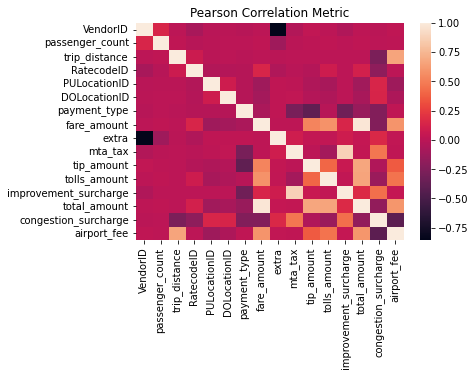

In [35]:
sns.heatmap(df.corr())
# wow that's easy...

plt.title('Pearson Correlation Metric')
plt.show()

Things to take note of:
- `trip_distance` highly correlates with high tips, tolls and overall trip amount
- `payment_type` seems to have some form of negative correlation with `tip_amount`. **Be careful as this is a discrete category.**
- Having `VendorID` as an feature **is misleading**, why??? 

**Important:** Only include numerical and ordinal features when computing the Pearson Correlation metric. You cannot compute the correlation between a category and numerical feature (i.e `VendorID` vs `payment_type` vs `trip_distance`).

How about Locations? Does correlation work for it?

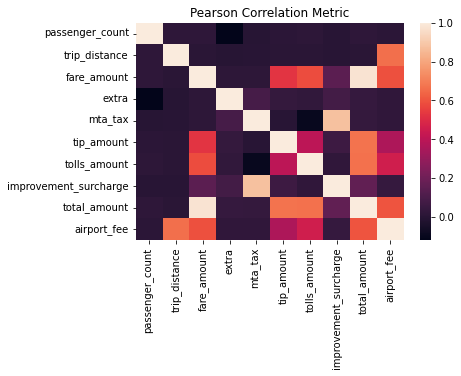

In [36]:
CORR_COLS = [
    "passenger_count", "trip_distance", "fare_amount", "extra", 
    "mta_tax", "tip_amount", "tolls_amount", "improvement_surcharge", 
    "total_amount", "airport_fee"
]

sns.heatmap(df[CORR_COLS].corr())

plt.title('Pearson Correlation Metric')
plt.show()

- If you're interested in calculating correlation between nominal and continuous data, here's a [great explanation](https://stats.stackexchange.com/questions/119835/correlation-between-a-nominal-iv-and-a-continuous-dv-variable/124618#124618).   
- Remember, you need to refer back to the data dictionary as well as the fare page: https://www1.nyc.gov/site/tlc/passengers/taxi-fare.page

- You should especially take note of the fare page if you're looking to see how `RatecodeID` plays a role on the fare.

If you would like to use `pyspark` for the full dataset, you can compute the Pearson correlation between any two features. We don't expect students to use the full distribution for each field or use Spearman for nominal features, though, you are more than welcome to do so if you would like.

In [37]:
from pyspark.ml.stat import Correlation

sdf \
    .where(
        F.col('payment_type') == 1
    ) \
    .corr('trip_distance', 'tip_amount')

0.6649247425844644

We'll cover this in a bit more detail in the next tutorial, though, just be aware that `pyspark.ml` is out of scope for this subject due to time constraints.

`VectorAssembler` is a function used to merge multiple columns into a single vector column. This is required as Spark works for single vectors only. Just note that Spark's correlation is still a Work-In-Progress (WIP) so it can't handle `NULL` values. Make sure to drop or impute them (with justification) for your own project.

The process for this mirrors `sklearn` i.e `model.fit()` or `data.transform()` so this shouldn't be too unfamiliar.

In [38]:
import matplotlib.pyplot as plt
from pyspark.ml.feature import VectorAssembler
from pyspark.ml.stat import Correlation

features = "correlation_features"
assembler = VectorAssembler(
    inputCols=CORR_COLS, # input names (can be list of fields)
    outputCol=features # output name (single vector output)
)

# transform the features -> this is similar to sklearn's .fit() or .transform()
feature_vector = assembler \
                .transform(
                    sdf.dropna('any')
                ) \
                .select(features)

corr_matrix_dense = Correlation.corr(feature_vector, features)
corr_matrix_dense

22/07/24 13:45:03 WARN InstanceBuilder$NativeBLAS: Failed to load implementation from:dev.ludovic.netlib.blas.JNIBLAS
22/07/24 13:45:03 WARN InstanceBuilder$NativeBLAS: Failed to load implementation from:dev.ludovic.netlib.blas.ForeignLinkerBLAS


pearson(correlation_features)
1.0 ...


As you can see in this intermediate step, we have a dense vector output. This is one exception where using `.collect()` is required. We'll grab the dense vector and create  a `pandas` dataframe. There's no need for `pyspark` since the results are computed already.

In [39]:
corr_matrix = corr_matrix_dense.collect()[0][0].toArray().tolist()

df_corr = pd.DataFrame(corr_matrix, index=CORR_COLS, columns=CORR_COLS)

In [40]:
df_corr

,passenger_count,trip_distance,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount,airport_fee
passenger_count,1.000000,0.021854,0.001310,-0.110886,0.001391,0.011675,0.016251,0.005271,0.001742,0.014662
trip_distance,0.021854,1.000000,0.058979,0.020962,-0.027088,0.520934,0.604005,0.020143,0.073365,0.635970
fare_amount,0.001310,0.058979,1.000000,0.001246,0.000077,0.037136,0.040911,0.010493,0.999733,0.039312
extra,-0.110886,0.020962,0.001246,1.000000,0.094702,0.032309,0.022528,0.084402,0.003837,0.019491
mta_tax,0.001391,-0.027088,0.000077,0.094702,1.000000,-0.010590,-0.087195,0.873613,0.002083,0.025335
tip_amount,0.011675,0.520934,0.037136,0.032309,-0.010590,1.000000,0.417083,0.062262,0.057798,0.363882
tolls_amount,0.016251,0.604005,0.040911,0.022528,-0.087195,0.417083,1.000000,0.025692,0.057499,0.465412
improvement_surcharge,0.005271,0.020143,0.010493,0.084402,0.873613,0.062262,0.025692,1.000000,0.014601,0.041728
total_amount,0.001742,0.073365,0.999733,0.003837,0.002083,0.057798,0.057499,0.014601,1.000000,0.049971
airport_fee,0.014662,0.635970,0.039312,0.019491,0.025335,0.363882,0.465412,0.041728,0.049971,1.000000


Whilst the precision is excellent (and this is why using Spark is great over pandas), when presenting a report there should be at most 4 decimal places. 

We'll round it to 4 decimal places using a `pandas` option.

In [41]:
pd.options.display.float_format = '{:,.4f}'.format # any number of digits with 2 floating points

In [42]:
df_corr

,passenger_count,trip_distance,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount,airport_fee
passenger_count,1.0000,0.0219,0.0013,-0.1109,0.0014,0.0117,0.0163,0.0053,0.0017,0.0147
trip_distance,0.0219,1.0000,0.0590,0.0210,-0.0271,0.5209,0.6040,0.0201,0.0734,0.6360
fare_amount,0.0013,0.0590,1.0000,0.0012,0.0001,0.0371,0.0409,0.0105,0.9997,0.0393
extra,-0.1109,0.0210,0.0012,1.0000,0.0947,0.0323,0.0225,0.0844,0.0038,0.0195
mta_tax,0.0014,-0.0271,0.0001,0.0947,1.0000,-0.0106,-0.0872,0.8736,0.0021,0.0253
tip_amount,0.0117,0.5209,0.0371,0.0323,-0.0106,1.0000,0.4171,0.0623,0.0578,0.3639
tolls_amount,0.0163,0.6040,0.0409,0.0225,-0.0872,0.4171,1.0000,0.0257,0.0575,0.4654
improvement_surcharge,0.0053,0.0201,0.0105,0.0844,0.8736,0.0623,0.0257,1.0000,0.0146,0.0417
total_amount,0.0017,0.0734,0.9997,0.0038,0.0021,0.0578,0.0575,0.0146,1.0000,0.0500
airport_fee,0.0147,0.6360,0.0393,0.0195,0.0253,0.3639,0.4654,0.0417,0.0500,1.0000


We can compare the differences in correlation between the full distribution and 5% random sample.

What we do below **is not a valid comparison**. We are merely using it tell you that the LHS is not the same as the RHS.

In [43]:
df[CORR_COLS].corr()

,passenger_count,trip_distance,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount,airport_fee
passenger_count,1.0000,0.0190,0.0186,-0.1203,-0.0025,0.0094,0.0151,0.0004,0.0190,0.0094
trip_distance,0.0190,1.0000,0.0059,-0.0048,0.0005,0.0061,0.0031,0.0005,0.0061,0.6604
fare_amount,0.0186,0.0059,1.0000,0.0112,0.0122,0.5246,0.5830,0.1431,0.9769,0.5910
extra,-0.1203,-0.0048,0.0112,1.0000,0.0896,0.0351,0.0268,0.0805,0.0409,0.0225
mta_tax,-0.0025,0.0005,0.0122,0.0896,1.0000,0.0014,-0.0970,0.8762,0.0337,0.0204
tip_amount,0.0094,0.0061,0.5246,0.0351,0.0014,1.0000,0.3997,0.0601,0.6681,0.3598
tolls_amount,0.0151,0.0031,0.5830,0.0268,-0.0970,0.3997,1.0000,0.0221,0.6634,0.4551
improvement_surcharge,0.0004,0.0005,0.1431,0.0805,0.8762,0.0601,0.0221,1.0000,0.1627,0.0416
total_amount,0.0190,0.0061,0.9769,0.0409,0.0337,0.6681,0.6634,0.1627,1.0000,0.6011
airport_fee,0.0094,0.6604,0.5910,0.0225,0.0204,0.3598,0.4551,0.0416,0.6011,1.0000


In [44]:
abs(df_corr.abs() - df[CORR_COLS].corr().abs())

,passenger_count,trip_distance,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount,airport_fee
passenger_count,0.0000,0.0029,0.0173,0.0094,0.0011,0.0022,0.0012,0.0049,0.0172,0.0052
trip_distance,0.0029,0.0000,0.0531,0.0162,0.0266,0.5148,0.6009,0.0196,0.0673,0.0244
fare_amount,0.0173,0.0531,0.0000,0.0100,0.0121,0.4875,0.5421,0.1326,0.0228,0.5516
extra,0.0094,0.0162,0.0100,0.0000,0.0051,0.0028,0.0043,0.0039,0.0371,0.0030
mta_tax,0.0011,0.0266,0.0121,0.0051,0.0000,0.0092,0.0098,0.0026,0.0316,0.0050
tip_amount,0.0022,0.5148,0.4875,0.0028,0.0092,0.0000,0.0174,0.0022,0.6103,0.0041
tolls_amount,0.0012,0.6009,0.5421,0.0043,0.0098,0.0174,0.0000,0.0036,0.6059,0.0103
improvement_surcharge,0.0049,0.0196,0.1326,0.0039,0.0026,0.0022,0.0036,0.0000,0.1481,0.0002
total_amount,0.0172,0.0673,0.0228,0.0371,0.0316,0.6103,0.6059,0.1481,0.0000,0.5511
airport_fee,0.0052,0.0244,0.5516,0.0030,0.0050,0.0041,0.0103,0.0002,0.5511,0.0000


Look at this... there is a significant difference between `correlation(total_amount, tolls_amount)` between the two correlation matrices. **Be careful**. 

## Feature Engineering?
- We want to see if the the profitability of zones remains consistent with respect to hour of day, day of week and pickup location. The distribution of profitable zones should be similar across all years.

- How is a zone profitable? Frequency of trips? Duration of trips? Best "earners"? We've had creative metrics over the past few years that students invented. 

- For example, you could create your own feature and scale it accordingly. Perhaps the expected dollar per minute + possible tolls scaled by the expected frequency of trips might be a good start.

- Just remember that trip frequency $\approx$ taxi demand in a zone (you don't know the true number of taxis in a zone at the time).

- Additionally, variable rate fares exist: _"50 cents per 1/5 mile when travelling above 12mph OR 50 cents per 60 seconds in slow traffic or when the vehicle is stopped."_ 

- This means profit rates may require you to state the assumption that you are assuming constant velocity throughout the trip. We have had students in the past approximate this by finding speed limits of zones in NYC.